In [1]:
! pip install scikit-surprise

  Using cached scikit_surprise-1.1.4.tar.gz (154 kB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached joblib-1.5.3-py3-none-any.whl.metadata (5.5 kB)
Using cached joblib-1.5.3-py3-none-any.whl (309 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 20.0 MB/s  0:00:000.3 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.9/20.9 MB 15.5 MB/s  0:00:015.7 MB/s eta 0:00:01:01
  Created wheel for scikit-surprise: filename=scikit_surprise-1.1.4-cp312-cp312-macosx_11_0_arm64.whl size=464027 sha256=26af1224ddae6a4796f06344bd72f0859fdfc6a19acd8991e3af1f971718c80c
  Stored in directory: /Users/mzohaibnasir/Library/Caches/pip/wheels/75/fa/bc/739bc2cb1fbaab6061854e6cfbb81a0ae52c92a502a7fa454b
Successfully built scikit-surprise
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4/4 [scikit-surprise]3/4 [scikit-surprise]


In [ ]:
! 

# what is a recommendation system 
Recommmednation systems are systems that predict ratings or preferences a user might give to an iteam.  it is based on tht user's previous behavior or the behavior of other users

often these are sorted and presented as 'Top N' recommednations



You're essentially correct, but let me tighten the definition.

Recommendation systems predict the **relevance** or **utility** of items to users, not just ratings. Rating prediction is one approach (collaborative filtering), but modern systems often predict implicit signals like click probability, watch time, or purchase likelihood.

Your definition covers two of the three main paradigms:

1. **Collaborative filtering** — using behavior of similar users
2. **Content-based filtering** — using the user's own past behavior plus item attributes

You're missing the third:

3. **Knowledge-based systems** — using explicit user requirements or constraints (common in high-stakes domains like real estate or cars where users have specific criteria)

The "Top N" framing is correct for most consumer applications. The system scores all candidate items, ranks them, and presents the top N. Though in practice, the ranking often incorporates business logic (diversity, freshness, monetization) beyond pure relevance scores.

One nuance: modern production systems are typically **hybrid**, combining multiple signals. Netflix doesn't just use what similar users watched; it also uses content metadata, your viewing context, time of day, device, and dozens of other features fed into deep learning models.

Is there a specific aspect of recommendation systems you're trying to understand or build?


# type of recommenders
1. recomedning things, 
2. recomeding content
3. recomednging music (considring music properties like waves of songs you like ,,i.e. tempo)
4. recomeding people i.e. online dating
5. recomneding seaRCH RESULTS

Nice list. You’re already thinking like a systems designer 👍
Let’s clean this up and reason **from first principles**, then I’ll point out **gaps, overlaps, and where you might be slightly off**.

---

## First principle: what *is* a recommender?

At the core, **all recommenders do the same thing**:

> Given a **user**, a **context**, and a **goal**, rank a set of options by **expected usefulness**.

Everything else is implementation detail.

So the true dimensions are **not “what is being recommended”**, but:

* what signals we use
* what objective we optimize
* how feedback is collected

---

## Your list — refined and corrected

### 1. “Recommending things”

This is **too vague** to be a category.

Examples:

* Products (Amazon)
* Videos (YouTube)
* Restaurants (Google Maps)

👉 From a systems POV, this is just:
**Item recommendation (generic objects)**

**Signals used:**

* Past behavior
* Similar users
* Item metadata

So this is not a *type*, it’s a **container**.

---

### 2. “Recommending content”

This is valid, but it’s a **special case** of item recommendation.

Content has special properties:

* Consumption time
* Fatigue
* Novelty decay
* Engagement loops

Examples:

* News feeds
* Short-form video
* Blogs

👉 Key difference from products:

* You can consume *a lot* of content
* Feedback is fast and implicit (scroll, pause, skip)

So this is a **behaviorally dense recommender**.

---

### 3. “Recommending music (tempo, waves, etc.)”

You’re **very right here**, and this is an important distinction.

Music recommendation is **signal-rich but language-poor**:

* Tempo
* Key
* Timbre
* Rhythm patterns
* Energy over time (“waves” as you said — good intuition)

This is:

> **Representation-based recommendation**

Instead of “users who liked X also liked Y”, we use **continuous feature space**.

Same applies to:

* Images
* Audio
* Sometimes video

You’re thinking in the right direction here 👏

---

### 4. “Recommending people (online dating)”

This is **not just recommendation** — this is **matching**.

Key difference:

* Two-sided preferences
* Mutual acceptance required
* Strategic behavior (people optimize profiles)

This breaks many standard recommender assumptions.

This category should be:

> **Two-sided / reciprocal recommenders**

Other examples:

* Job matching
* Marketplace buyers & sellers
* Social networks (friend suggestions)

Big conceptual leap here.

---

### 5. “Recommending search results”

This is **related but fundamentally different**.

Search is:

* Intent-driven
* Query-dependent
* Short-term goal oriented

Recommenders are:

* Preference-driven
* Long-term modeling
* Often proactive

Search ranking = **relevance to query**
Recommendation = **relevance to user**

So search is:

> **Query-conditioned ranking**, not classical recommendation

You were right to separate it, but the reason matters.

---

## The missing types (important gaps)

### 🔴 Gap 1: Context-aware recommenders

Same user, different situation.

Examples:

* Time of day
* Location
* Device
* Mood

Spotify “morning commute” is different from “late night”.

This is a **major real-world category** you didn’t list.

---

### 🔴 Gap 2: Sequential / trajectory recommenders

Not “what do you like”, but:

> “What should come *next*?”

Examples:

* Next video
* Next song
* Next lesson

This models **user state evolution**, not static preference.

---

### 🔴 Gap 3: Exploration vs exploitation systems

Sometimes the goal is **not accuracy**, but:

* Discovery
* Diversity
* Long-term retention

TikTok, Netflix, Spotify heavily optimize this.

This is a *control problem*, not just ML.

---

### 🔴 Gap 4: Causal recommenders

Most recommenders ask:

> “What is correlated with engagement?”

Causal ones ask:

> “What actually changes user behavior?”

This is where A/B testing + counterfactuals live.

---

## A cleaner, first-principles taxonomy (recommended)

Instead of “what is recommended”, classify by **problem structure**:

### 1. Item recommendation (products, content)

### 2. Representation-based (music, images, audio)

### 3. Two-sided / matching (people, jobs)

### 4. Context-aware recommendation

### 5. Sequential / next-step recommendation

### 6. Exploration-optimized systems

### 7. Query-based ranking (search)

Your list touched **4 of these** — that’s solid.

---

## Where you were slightly wrong (and why it matters)

* “Things” is not a category → it hides structure
* Music is not just content → it’s feature-space driven
* Search ≠ recommendation → intent vs preference
* People recommendation ≠ items → mutuality breaks assumptions

These distinctions matter because **algorithms that work in one fail badly in another**.

---

## If you want to go deeper

Tell me:

* Are you exploring this for **ML/system design**, **startup ideas**, or **pure learning**?
* Do you want to **build one**, **study theory**, or **compare real-world systems**?

Next step options:

* Design a recommender from scratch (whiteboard style)
* Compare TikTok vs Spotify vs Tinder from first principles
* Learn the *minimum math* needed to truly understand them

You’re asking the *right* kind of questions.


Yes. You’re circling the **core truth** of recommender systems. Let’s slow this down, clean it up, and sharpen it **from first principles**, because what you’re saying is *mostly right* — just a bit mixed together.

I’ll be intuitive, not academic.

---

## First principle: a recommender only sees **signals**

It never sees “liking”.
It sees **actions** and tries to *infer intent*.

So the real question is:

> Which actions are **strong**, **weak**, **noisy**, or **misleading** signals?

---

## 1. Explicit signals (what users say)

Examples:

* Ratings (⭐ 1–5)
* Likes / dislikes
* “Choose your interests”
* Surveys

### Why you’re right

* They’re **semantic** (a 4★ *means* something)
* Easy to collect
* Cold-start friendly

### But here’s the catch (important gap)

Explicit signals are:

* **Sparse** (most users don’t rate)
* **Inconsistent** (my 4★ ≠ your 4★)
* **Context-free** (why 4★? mood? expectations?)

A 4★ is not a number — it’s a **compressed opinion** with lost information.

👉 So explicit ≠ high-quality, just *interpretable*.

---

## 2. Implicit signals (what users do)

Examples:

* Clicks
* Watch time
* Scroll depth
* Replays
* Skips
* Dwell time

You’re 100% right here.

Implicit signals are:

* **Dense**
* **Continuous**
* **Behaviorally honest**

But…

### Hidden problem

They are **ambiguous**.

Did the user:

* Watch because they loved it?
* Or because autoplay trapped them?
* Or because they were distracted?

So implicit signals are **high-volume but noisy**.

---

## 3. Purchase signals (the gold standard)

You nailed this.

Purchases are:

* High effort
* High commitment
* High cost

Which makes them:

> **Strong revealed preference**

Buying something says:
“I liked this enough to sacrifice money.”

But even purchases aren’t perfect:

* Budget constraints
* One-time needs
* Gifts for others

So they’re **strong**, not **pure**.

---

## 4. Consumption signals (YouTube, Netflix, Spotify)

This is a **special hybrid class**.

Consumption is:

* Stronger than a click
* Weaker than a purchase
* Sequential
* Time-dependent

Examples:

* Watch 5 seconds vs 10 minutes
* Skip intro
* Rewatch
* Binge patterns

This lets systems infer:

* Interest strength
* Fatigue
* Curiosity vs commitment

This is why YouTube & TikTok are so powerful.

---

## The missing insight (very important)

Signals differ on **three axes**, not one.

### Axis 1: Cost to user

Low → click
High → purchase

Higher cost = stronger signal.

---

### Axis 2: Intent clarity

Clear → rating, purchase
Ambiguous → scroll, autoplay watch

---

### Axis 3: Coverage

Sparse → ratings
Dense → engagement logs

The best systems **combine all three**, not choose one.

---

## A clean mental model (use this)

Think of signals as **votes with different weights**:

| Signal type      | Strength  | Noise  | Coverage |
| ---------------- | --------- | ------ | -------- |
| Explicit ratings | Medium    | Low    | Very low |
| Likes            | Medium    | Medium | Low      |
| Watch time       | High      | Medium | High     |
| Rewatch          | Very high | Low    | Medium   |
| Purchase         | Very high | Low    | Low      |
| Skip             | Negative  | Medium | High     |

Recommenders don’t “believe” signals — they **weight them**.

---

## Subtle but critical correction

> “Things you consume like YouTube is a good signal”

Yes — **but only when normalized**.

5 minutes of a 6-minute video ≠ 5 minutes of a 2-hour podcast.

So systems model:

* % completion
* Relative engagement
* User baseline behavior

This is where many naïve systems fail.

---

## Final first-principles takeaway

A recommender is basically:

> A belief-updating system under uncertainty.

Each signal nudges belief up or down.

Good systems:

* Don’t trust any single signal
* Model *why* an action happened
* Optimize long-term satisfaction, not short-term clicks

---

If you want, next we can:

* Design a **signal weighting scheme** from scratch
* Break down **YouTube vs Amazon signals**
* Talk about **how systems get corrupted by engagement hacking**
* Or map signals → algorithms (matrix factorization, embeddings, bandits)

You’re thinking at the right depth — now we just need to tighten the mental model.


# TOP-N RECOMMENDERS
that means these recommender engine job is to give ou a short list of things that you might like ,, N can be even 100
our goal is to produce top recomednation for users


# (one ) anatomy of top-N recomender
but gernally you start with some data store that stoer individial interest of each users like videos they have seen or implict ratings like things they have bought in past. In practive it is big distributed nosql data store like casndra/mongodb because it has to vent alot of data but woth very simple queries. Idally this interest data is normlaized usnging techniques like mean centering or z scores to enssure  data is comparable between users but in real world your data is too sparse to normalize effectively.
the first process is to genraate candidates, items that we think might be intersting to users based on past behaviors. So the candidate genration phase might take all the items that users indicated intersted in before, and colnsult another data store taht is similar to those based on aggreagate behavior. 

let's take an exmaple, you might consult db for individualn intersts and see that I liked the star trek stuff in the past, based on everyone else's behavior , I know people who like star trek , also liked star wars, so based on my interst in start trek, i should get ssome recommmedndation cacnditates that arerelated to star wars, and based on those recomednation engines, i would assign some score to each candidaite based on how I rated the item they came from adn how strong similarities are between the items and the candidates that came because of those items.
 I might filter out the candiates who score is low. next comes cadidate ranking, many candidates mmght appear more thqanonce and they need to be combined together in some way. mauybe boosting their score  in the process since they keep coming up repreatedly, and after that it would be simoply sorting based on scores to get out first top N recomndeations.


 we can make it  complex, by usig ml to rank candidates. it can also has moeacces to info that can be used to boost scores for high rated alements.

 In fuiltering, we might be eliminate items which user have alrady rated, have low score, or min rating thrshold.

 so flow is go though indivicual interst , based on those indivudal interst in individual intersts store and based on items we get from there which will be ones according to my profile, based on those items, we find item similarites , then we genreatae candiats, assign scores , reanking and do filtering at end.

![Screenshot 2026-01-27 at 12.02.59 AM.png](<attachment:Screenshot 2026-01-27 at 12.02.59 AM.png>)
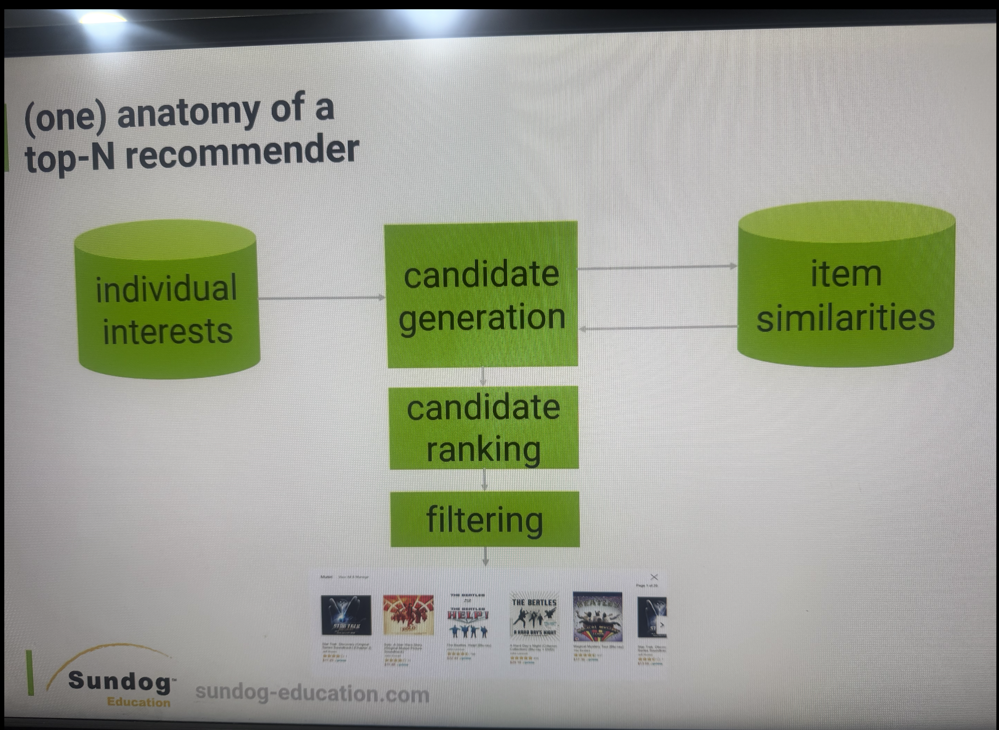

Good, this diagram is a **classic item-based collaborative filtering (IBCF)** pipeline.
Let me explain it **precisely, technically, and intuitively**, and also point out **what the diagram hides**.

I’ll walk **left → right → down**, like the data actually flows.

---

# 1️⃣ “Individual interests” (left cylinder)

This is **not** “user preferences” in the human sense.

Technically, it is:

> A **sparse interaction history**
> `H_u = {(item_id, signal_strength, timestamp)}`

Examples:

* watched Star Trek (watch_time = 95%)
* rated Star Trek = 4
* purchased Star Trek DVD

Key properties:

* sparse (most users touch very few items)
* implicit-heavy
* time-ordered

This store is usually:

* a **feature store**
* derived from raw event logs
* optimized for fast lookup by `user_id`

⚠️ Important intuition
This store does **not** say *what the user likes*.
It only says *what the user has done*.

---

# 2️⃣ “Item similarities” (right cylinder)

This is the **heart** of item-based CF.

Technically:

> A **precomputed item–item similarity graph**

Formally:

```
sim(i, j) = similarity between items i and j
```

How it’s built (offline):

* Look at all users
* Count co-occurrences:
  “users who interacted with i also interacted with j”
* Apply corrections:

  * popularity normalization
  * shrinkage
  * time weighting

Stored as:

```
TopNeighbors[i] = [(j1, sim1), (j2, sim2), ...]
```

This is **global knowledge**, not user-specific.

⚠️ Intuition
This table is basically:

> “Collective memory of the crowd”

No ML is *required* here — statistics alone can do it.

---

# 3️⃣ “Candidate generation” (middle, top)

This is where the two cylinders meet.

For a user `u`:

1. Take items from `H_u`
2. For each item `i`:

   * look up `TopNeighbors[i]`
3. Union all neighbors → **candidate pool**

Formally:

```
Candidates = ⋃_{i ∈ H_u} TopNeighbors[i]
```

But we also compute **retrieval scores**:

```
score(j) += sim(i, j) × weight(u, i)
```

Where:

* `sim(i, j)` = item similarity
* `weight(u, i)` = how strong user’s interaction with item i was

This step is:

* fast
* linear
* approximate
* recall-oriented

⚠️ Intuition
Candidate generation answers:

> “Based on things you touched, what else do people usually touch?”

Not:

> “What is best for you?”

---

# 4️⃣ “Candidate ranking” (middle, below)

At this point:

* you might have **hundreds or thousands** of candidates
* many items appear multiple times (via different source items)

Candidate ranking does **aggregation + scoring**.

Technically:

* combine duplicate candidates
* aggregate scores (sum, max, weighted sum)
* optionally add extra features:

  * popularity
  * recency
  * content metadata
  * user–item interaction features

This can be:

* heuristic (no ML)
* or ML-based (learning-to-rank)

Output:

```
[(item_id, predicted_score)]
```

⚠️ Intuition
This step answers:

> “Given *why* each item showed up, how promising does it look overall?”

---

# 5️⃣ “Filtering” (middle, bottom)

Filtering enforces **hard constraints**.

Typical filters:

* remove already-consumed items
* remove unavailable items
* remove unsafe / policy-violating items
* apply minimum quality thresholds

This is **not optimization**, it’s **eligibility**.

⚠️ Intuition
Filtering answers:

> “Which items are even allowed to be shown?”

---

# 6️⃣ Final output (bottom thumbnails)

After filtering:

* sort by score
* take top N
* return to UI

That’s your **Top-N list**.

---

# Why this is *item-based* CF (important)

This system:

* never compares users to users
* never needs a dense user vector
* relies entirely on **item–item relationships**

Formally:

> `user → items → similar items`

This is why it:

* scales well
* handles new users reasonably
* is stable
* was heavily used by Amazon, Netflix (early), etc.

---

# What the diagram *doesn’t show* (but matters)

### 1️⃣ Offline vs online split

* item similarities are computed **offline**
* online system only does lookups + aggregation

### 2️⃣ Time & context

* recency weighting
* session-based interest
* time-of-day effects

### 3️⃣ Exploration

* this diagram is purely exploitative
* no novelty injection shown

### 4️⃣ Feedback loop

* user actions update the interest store
* item similarities are periodically recomputed

---

# Mental model you should lock in

Item-based CF is:

> A **graph-walk over item co-occurrence**,
> seeded by a user’s interaction history,
> producing candidates that are then **scored, filtered, and ranked**.

If you understand that sentence deeply, you understand the diagram.

---

If you want next, I can:

* contrast this with **user-based CF**
* show **why embeddings replaced similarity tables**
* walk through **numerical example with real scores**
* explain **failure modes of item-based CF**

Just tell me where to zoom in.


You’ve got the **right high-level shape**: *two-stage system* (candidate generation → ranking) with filtering/deduping and a top-N output.

Now I’ll tighten it from first principles and point out where your mental model is slightly off or incomplete.

---

## What you said that’s correct

* **Top-N** = “return a short ranked list (N could be 10–100+)” ✅
* **Two-stage architecture** (retrieve candidates cheaply, then rank with more compute) ✅
* **Collaborative signal intuition** (“Star Trek → Star Wars because similar users”) ✅
* **Deduping + score aggregation** when candidates come from multiple sources ✅
* **Ranking can be ML** and can use richer features ✅
* **Filter out seen items** / hard constraints ✅

That’s basically the industry standard skeleton.

---

## Key corrections & gaps

### 1) “Interest store in Cassandra/Mongo”

This is *sometimes* true but it’s not the core requirement.

First principle: your system needs **two different kinds of storage**:

1. **Event log** (append-only): raw interactions (views, clicks, purchases)

   * Think: Kafka + data lake/warehouse.
2. **Serving features / profiles** (fast key-value lookup): user vectors, counters, last-K items, etc.

   * Could be Redis/Cassandra/Scylla/DynamoDB/etc.

So “NoSQL” is plausible for the serving layer, but the *real backbone* is:
**log → offline/stream processing → feature store → serving.**

Also: MongoDB isn’t a common first choice at huge scale for this pattern (not impossible, just less typical than Dynamo/Scylla/Cassandra + Redis caches).

---

### 2) “Normalize with mean-centering / z-scores”

This is the biggest misconception.

That style of normalization is from classic **explicit rating matrix** CF (like old Netflix ratings).
Modern recommenders mostly work with **implicit feedback** (views, watch time, purchases), and they usually **don’t z-score per user** because:

* implicit data is not “Gaussian measurement”
* user scales vary + are context dependent
* sparsity makes per-user statistics unstable

What’s more common:

* **calibrated labels** (e.g., “watched ≥ X%” = positive)
* **per-item debiasing** (popularity correction)
* **time decay** (recent actions matter more)
* **user baseline features** (this user watches long videos in general)

So: you were right that sparse data makes those classic normalizations shaky — but also: **most real systems don’t use z-scores there anyway.**

---

### 3) Candidate generation isn’t only “similar items”

You described *one retrieval channel*: item-to-item collaborative filtering (“people who liked X liked Y”). That’s great, but production systems usually combine several channels to avoid blind spots:

Common candidate sources:

* **Item-to-item CF** (your Star Trek → Star Wars)
* **User-to-user CF** (similar users → items they liked)
* **Content-based** (metadata/embeddings: sci-fi, actors, topics)
* **Popularity / trending** (global + within segments)
* **Fresh / exploration pool** (to learn + avoid filter bubbles)
* **Business constraints** (availability, safety, policy, inventory)

Then you union them, dedupe, and send to ranking.

---

### 4) “Score candidates by similarity × rating strength”

Good instinct, but in real systems that score is usually a **retrieval heuristic**, not the final truth.

Candidate scoring at retrieval time tends to be:

* fast
* approximate
* vector-based or co-occurrence based

The final ordering typically comes from a **learned ranker** optimizing a metric (CTR, watch time, conversion, retention, etc.).

---

### 5) Filtering “at the end” is wasteful

Some filtering happens **early** to save compute:

* remove already-seen items
* remove unavailable items
* enforce safety/policy constraints

Then later filters re-check with more context.

Think: **hard rules early**, **soft rules late**.

---

### 6) “Sort by score and take top N”

That’s the simplest version, but top systems do *post-ranking* too:

Post-ranking often adds:

* **diversity** (not 10 near-identical items)
* **freshness/recency**
* **serendipity**
* **creator/inventory constraints**
* **session intent** (what the user is doing right now)

So final output is often:

> “ranked list” → “re-ranked list” (with constraints)

---

## A cleaner “anatomy of Top-N” (production mental model)

### A) Data & features (offline + streaming)

* event log: views, clicks, purchases, skips, dwell time
* transform into:

  * user profile (last-K items, counts, user embedding)
  * item profile (metadata, item embedding, popularity, freshness)
  * context features (time, device, locale)

### B) Candidate generation (fast retrieval, ~10ms–100ms)

Goal: fetch **hundreds to tens of thousands** of candidates.
Methods:

* item-to-item tables
* ANN search in embedding space (nearest neighbors)
* segment popularity lists
* exploration pool

### C) Ranking (heavier compute)

Goal: pick the **best ordering** for this user *now*.

* model: GBDT / DNN / two-tower + cross features / LTR
* predicts something like expected watch time / conversion / satisfaction proxy

### D) Post-ranking (constraints + UX)

* dedupe, diversity, freshness
* policy constraints
* blending (mix sources: some safe familiar, some new)

### E) Feedback loop

* log what was shown + what user did
* train again
* A/B test

That loop is the system.

---

## Your Star Trek example — upgraded

Your reasoning becomes stronger if you treat it like:

* From Star Trek, get 200 similar items (CF + embedding neighbors)
* From user’s *recent session*, get 200 more (session-based)
* Add 100 trending sci-fi right now
* Add 100 “exploration” items
* Union → dedupe → ~500–2000 candidates
* Rank with ML using features:

  * similarity scores
  * recency
  * user embedding • item embedding
  * popularity (with debias)
  * context (time/device)
* Post-rank to ensure variety (not all Star Wars)

---

## The one question that forces first-principles clarity

When you design a top-N system, always ask:

**“What exact objective am I optimizing?”**

* clicks? watch time? purchases? retention? satisfaction?

Because *the same pipeline* can produce very different behavior depending on the objective.

---

If you want, I can help you turn your write-up into a crisp “system design” version by doing either:

1. **Rewrite your anatomy** into a clean diagram + bullet spec, or
2. **Pick one domain (YouTube/Amazon/Spotify)** and design the full pipeline with realistic components + tradeoffs (latency, scale, cold start, feedback loops).


Got it. Let’s **slow way down** and build this **from the ground up**, *intuition first*, no buzzwords unless they earn their keep.
Think of this like learning physics by imagining forces, not equations.

---

# 0️⃣ Start from the *real* problem (forget “recommenders”)

Imagine you’re running a **tiny video store** with **1 million videos** and **1 million users**.

A user opens the app and asks (implicitly):

> “What should I watch *right now*?”

You have **100 ms** to answer.

You **cannot**:

* scan all 1M videos
* deeply think about everything
* ask the user questions

So what do you do?

This constraint **forces the architecture**.

---

# 1️⃣ Why Top-N exists (intuition)

Top-N means:

> “I don’t need the *best* thing in the universe —
> I need **10–100 things that are probably good**.”

Human brains work this way too:

* you don’t consider every movie ever made
* you shortlist, *then* decide

So Top-N = **shortlisting under uncertainty**.

---

# 2️⃣ Two phases exist because of *physics*

There are only two kinds of thinking:

* **fast & dumb**
* **slow & smart**

That’s it.

So recommender systems split into:

### Phase 1 — Candidate generation (fast & dumb)

Question:

> “What *might* be relevant?”

Rules:

* must be cheap
* can be wrong
* must not miss good stuff

Think:

> “Let’s grab *plausible* things.”

---

### Phase 2 — Ranking (slow & smart)

Question:

> “Among these, what’s best *for this user right now*?”

Rules:

* expensive models allowed
* lots of features
* fewer items

Think:

> “Now let’s actually think.”

This is not optional — it’s forced by scale.

---

# 3️⃣ What is “user interest” really?

You said:

> “store individual interests like videos seen, purchases, ratings”

But intuitively:
**there is no such thing as ‘interest’ in the system.**

There are only:

* actions
* timestamps
* context

“Interest” is a **belief** you infer.

So instead of:

> user likes sci-fi

The system thinks:

> user watched 3 sci-fi videos recently
> finished 2 of them
> skipped 1 quickly
> did this at night
> on mobile

Interest = **compressed history**.

---

# 4️⃣ Why we don’t “normalize” like statistics class

Mean-centering assumes:

* stable scale
* honest ratings
* enough data

Reality:

* users behave differently every day
* most don’t rate
* signals are contextual

So instead of normalizing numbers, we normalize **meaning**.

Example:

* 10 minutes watched:

  * great for a 12-min video
  * terrible for a 2-hour podcast

So systems ask:

> “Is this *more than usual* for *this user* on *this type* of item?”

That’s intuition, not z-scores.

---

# 5️⃣ Candidate generation: why “Star Trek → Star Wars” works

Let’s reason **mechanically**.

You liked Star Trek.

System asks:

> “When *other people* liked Star Trek, what else did they touch?”

That’s it.
No magic.

This builds a **co-occurrence graph**:

* nodes = items
* edge weight = how often they appear together in users’ histories

So:
Star Trek —(strong edge)— Star Wars

Candidate generation just:

> walks a few hops on this graph

It’s not “intelligence”.
It’s **crowd memory**.

---

# 6️⃣ Why candidates have scores at all

Each candidate answers:

> “Why am I here?”

Example:

* came from Star Trek similarity
* similarity strength = 0.8
* your engagement with Star Trek = high
  → confidence increases

Score ≈

> “How strong is the reason this item was retrieved?”

This score is **not the final ranking**.
It’s a *confidence hint*.

---

# 7️⃣ Why candidates appear multiple times

Because **good ideas repeat**.

If:

* Star Wars comes from Star Trek
* Star Wars also comes from Battlestar Galactica
* and from your recent session

That’s strong evidence.

So repetition ≈ **consensus across signals**.

That’s why we merge and boost.

---

# 8️⃣ Why filtering is not “just cleanup”

Filtering answers:

> “Is this item even *allowed* to compete?”

Examples:

* already watched → pointless
* unavailable → useless
* unsafe → forbidden

These are **hard constraints**, not preferences.

We apply them early to save brainpower.

---

# 9️⃣ Ranking: what ML *actually* does

ML doesn’t “decide”.

It predicts:

> “If I show this item *now*, what will likely happen?”

Inputs:

* user features
* item features
* context
* retrieval scores
* freshness
* popularity
* similarity

Output:

* expected watch time
* click probability
* satisfaction proxy

Ranking is **counterfactual guessing**.

---

# 🔟 Why we re-rank after ranking

Because pure optimization creates garbage UX.

Without re-ranking:

* 10 nearly identical videos
* no diversity
* no exploration

Post-ranking injects:

* variety
* freshness
* business logic
* long-term health

Think:

> “Yes, this is optimal — but it’s boring or risky.”

---

# 1️⃣1️⃣ The loop (this is the heart)

Everything feeds back.

What you show → how user reacts → what system believes → next recommendations

Bad loop:

* optimize clicks → clickbait → user distrust

Good loop:

* optimize satisfaction → trust → long-term usage

This is why objective choice matters more than algorithms.

---

# Final intuition to hold in your head

A Top-N recommender is:

> A **belief-updating machine**
> under **time & compute constraints**
> using **human behavior as noisy signals**
> to make **shortlists**, not truths.

If you internalize that, everything else snaps into place.

---

If you want, next we can:

* **Draw the whole system as a mental picture**
* **Simulate one user step-by-step**
* **Design a recommender without ML**
* **Show how bad objectives break systems**

Tell me how you want to continue — but now at least you’re standing on solid ground.


# GENRALLY SPEAKING CANDAidate genreation , , rankning, filtering would  live in  some distributed web service.

Yes — **generally** those steps live in a distributed online serving stack. But the *useful refinement* is: they don’t usually live as “one service”; they’re split by **latency, state, and blast radius**.

Here’s the refined, technical picture.

---

## 1) What “online recommender” service actually does

At request time (user opens app), the serving system must:

1. fetch user/context features (fast KV reads)
2. generate candidates (fast retrieval)
3. rank candidates (CPU/GPU inference)
4. apply filters + post-ranking constraints
5. return top N + log everything

This is typically a **fan-out / fan-in** pipeline: many small calls in parallel, then merge.

---

## 2) Typical distributed layout (practical)

### A) Reco Gateway / Orchestrator (stateless)

* receives request: (user_id, context)
* launches parallel calls to retrieval sources and feature services
* enforces timeouts + fallbacks
* merges candidates, dedupes, and calls ranker

This is often a normal microservice (Go/Java) with strict SLOs.

### B) Feature Store / Profile Store (stateful)

* user profile features: last-K items, counters, embeddings
* item features: metadata, embeddings, availability, safety flags
* served via low-latency stores: Redis + Cassandra/Scylla/DynamoDB, etc.

### C) Candidate Retrieval services (multiple “retrievers”)

Different retrievers = different recall strategies:

* ANN embedding search (vector DB / Faiss service)
* item-to-item CF table lookup
* trending / popularity lists
* content-based retrieval

They return: `[(item_id, retrieval_score, source)]`

### D) Ranking service (model inference)

* takes: candidates + features
* outputs: `score(item | user, context)`
* runs model(s): GBDT/DNN
* sometimes multi-stage rankers (light ranker → heavy ranker)

### E) Filtering + Post-ranking

Some rules are applied:

* **pre-ranking** (hard constraints): already-seen, unavailable, policy blocked
* **post-ranking** (UX constraints): diversity, freshness, quotas

This is often implemented inside the gateway/orchestrator or a dedicated “post-rank” component.

### F) Logging / Telemetry

Every stage logs:

* candidates retrieved
* features used (or feature IDs)
* final ranking + positions
* user actions later
  This is crucial for training + debugging + A/B tests.

---

## 3) Where you’re slightly off: “candidate generation, ranking, filtering live in a web service”

They “live online,” but **candidate generation is often mostly offline** too.

What’s offline:

* item-to-item neighbor tables
* item embeddings
* popularity lists, segment lists
* safety labels
* sometimes user embeddings

Online services mostly do:

* *lookup* precomputed stuff
* *combine* it
* *run inference*
* *apply constraints*

So: online serving is “real-time assembly + scoring”, not “compute everything from scratch.”

---

## 4) Latency-driven reason for splitting

This is the engineering constraint that shapes everything:

* feature fetch: ~1–10 ms each (parallel)
* candidate retrieval: ~5–30 ms
* ranking: ~5–40 ms (depending on model + K)
* post-ranking: ~1–5 ms
* budget: maybe 50–150 ms end-to-end

So services are split so each can be:

* scaled independently
* cached independently
* degraded independently (fallbacks)

---

## 5) The clean mental model

Think of the online recommender as a **distributed query plan**:

* **retrievers** = “indexes” (like search indexes)
* **ranker** = “scoring function”
* **filters** = “WHERE clause”
* **post-rank** = “constraints & diversification”
* **gateway** = “query planner”

That analogy is surprisingly accurate.

---

If you want, I can turn this into a concrete “request trace” with numbers (e.g., K=5000 → filter to 2000 → rank → rerank to 50) and show exactly what payloads look like between services.


# This was one appraoch, 



other one would be to start with whole high rated items in db .. but that'd meen looking at all all items in db which is not feasible for large dbs

Exactly. You’ve just hit a **fundamental design fork** in recommender systems.
Let’s make this *precise, intuitive, and technical* so it really sticks.

---

## 1️⃣ The “other approach” you’re describing

You’re saying:

> “Why not just start from all highly rated / popular items and rank them for the user?”

Conceptually, that would mean:

```
for item in ALL_ITEMS:
    score(user, item)
return top N
```

This is the **global ranking** idea.

---

## 2️⃣ Why this *doesn’t* work (first-principles)

### Reason 1: Computational complexity

If:

* |I| = 10⁶ items
* scoring takes even 1 µs

That’s **1 second per request** → totally unacceptable.

Real ranking models take **hundreds of µs to ms per item**.

So this approach is **O(|I|)** per request → dead on arrival.

---

### Reason 2: Memory & feature access

Scoring an item requires:

* item features
* sometimes cross features with user
* sometimes embeddings

Fetching those for *every item*:

* blows cache
* saturates memory bandwidth
* explodes tail latency

---

### Reason 3: Waste of computation

Most items are obviously irrelevant.

If user watches sci-fi:

* scoring cooking videos is pointless
* scoring kids cartoons is pointless

So 99.9% of work is wasted.

---

## 3️⃣ Why popularity-only shortcuts still fail

You might think:

> “Okay, not *all* items — just top-rated / popular ones.”

That helps but introduces new problems.

### A) Popular ≠ relevant

Popular items:

* work for new users
* fail for established users

This leads to:

* homogenization
* filter bubbles at the *global* level
* boredom

### B) Popularity bias feedback loop

If you always recommend popular items:

* they get more exposure
* they get more interactions
* they look even more popular

Long tail dies.

---

## 4️⃣ The deep insight (this is key)

Candidate generation exists **specifically to avoid global ranking**.

Formally:

> We approximate the argmax over all items
> by restricting the search space to a *likely subset*.

This is **approximate nearest neighbor search**, not brute force.

---

## 5️⃣ When “score everything” *does* make sense

There *are* limited cases where near-global scoring works:

### 1️⃣ Very small item sets

* job listings in a niche
* internal tools
* B2B catalogs with <10k items

### 2️⃣ Pre-filtered segments

Instead of all items:

* “popular sci-fi this week”
* “new releases in your country”

This is still **candidate generation**, just coarse.

### 3️⃣ Offline evaluation

* batch scoring for emails
* recommendations generated hours in advance

Still not real-time Top-N.

---

## 6️⃣ Unifying intuition (important)

Think of recommender design like this:

> **Global ranking is the ideal but impossible solution.
> Candidate generation is how we approximate it under constraints.**

Candidate generation answers:

> “Where should I even bother looking?”

Ranking answers:

> “Among these, what’s best?”

---

## 7️⃣ Why item-based CF is *one* solution

Item-based CF is a **cheap way to prune the search space** using:

* crowd wisdom
* sparse signals
* precomputation

Embedding-based retrieval is just a more continuous version of the same idea.

---

## 8️⃣ Refined mental model (lock this in)

You can’t:

* score everything
* fetch everything
* think about everything

So you:

1. **prune aggressively** (candidate generation)
2. **score carefully** (ranking)
3. **constrain sensibly** (filtering & post-rank)

That pattern shows up everywhere:

* databases
* search engines
* compilers
* recommender systems

---

## 9️⃣ One sentence summary (engineer-grade)

> Starting from all high-rated items implies **O(|I|) online scoring**, which violates latency and cost constraints; candidate generation exists to **approximate global ranking via search-space reduction**.

If that sentence feels obvious now, you’re learning correctly.

---

If you want, next we can:

* compare **item-based CF vs embedding ANN** as two pruning strategies
* design a **hybrid system** that mixes popularity + personalization
* walk through **cold-start logic** where popularity *is* the fallback

Tell me where to go next.


# Evaluating Recomednation Engines.
Measuring quality of recommendation engines


1. train/test splits

